#### Convert Bytes to MB,

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import gc
import pickle
import sys
import warnings
sys.path.insert(1, "../scripts")
warnings.filterwarnings('ignore')

In [2]:
import data_cleaning as cleaning
import data_summary as summary

## Exploratory Data Analysis

In [2]:
#load the the pkl dumps
df_cleaned = pd.read_pickle("../data/df_cleaned.pkl")
col_descript = pd.read_pickle("../data/colum_descript.pkl")
with open('../data/col_types.pickle', 'rb') as handle:
    col_types = pickle.load(handle)

#### Croass correletaion b/n numerical values

/home/abu-muhammed/anaconda3/envs/week1/lib/python3.11/site-packages/seaborn/matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


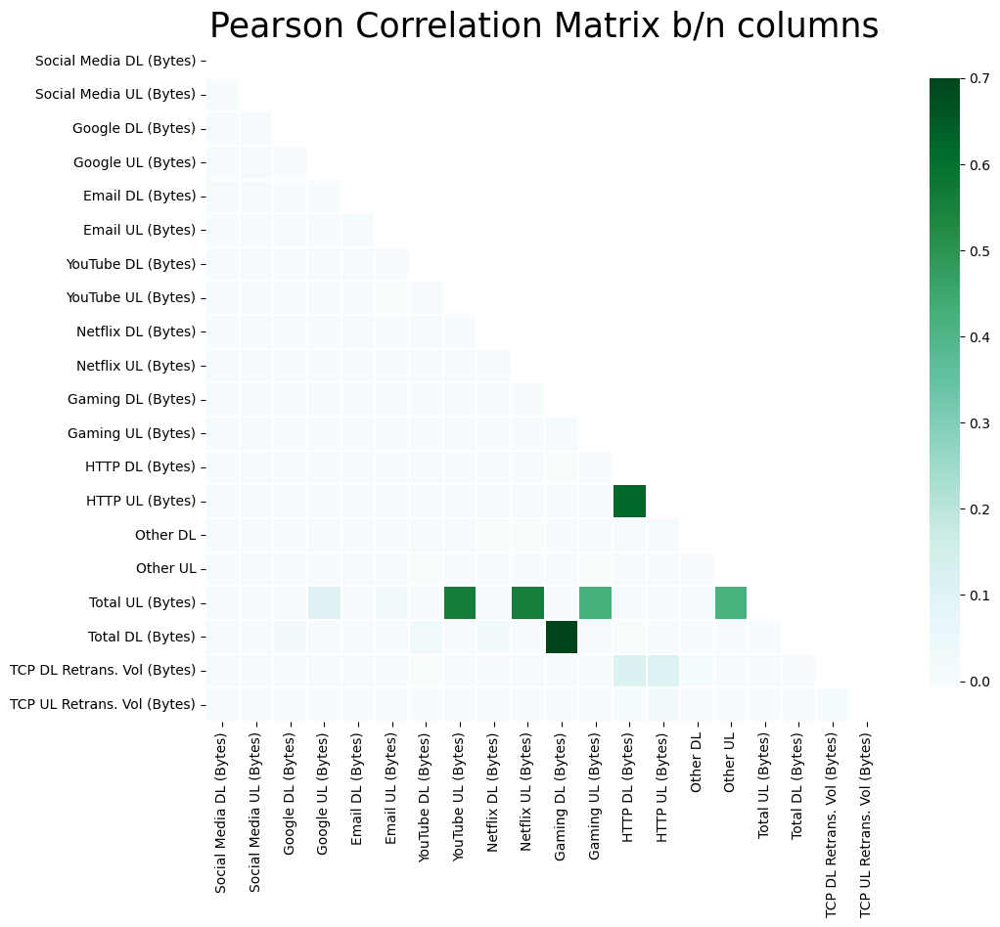

In [3]:
#cross correletion b/n numerical columns
mask = np.zeros_like(df_cleaned[col_types['numeric data']].corr(), dtype=bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(12, 9))
plt.title('Pearson Correlation Matrix b/n columns',fontsize=25)

sns.heatmap(df_cleaned[col_types['numeric data']].corr(),linewidths=0.25,vmax=0.7,square=True,cmap="BuGn", #"BuGn_r" to reverse
            linecolor='w',annot=True,annot_kws={"size":8},mask=mask,cbar_kws={"shrink": .9});

/home/abu-muhammed/anaconda3/envs/week1/lib/python3.11/site-packages/seaborn/matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


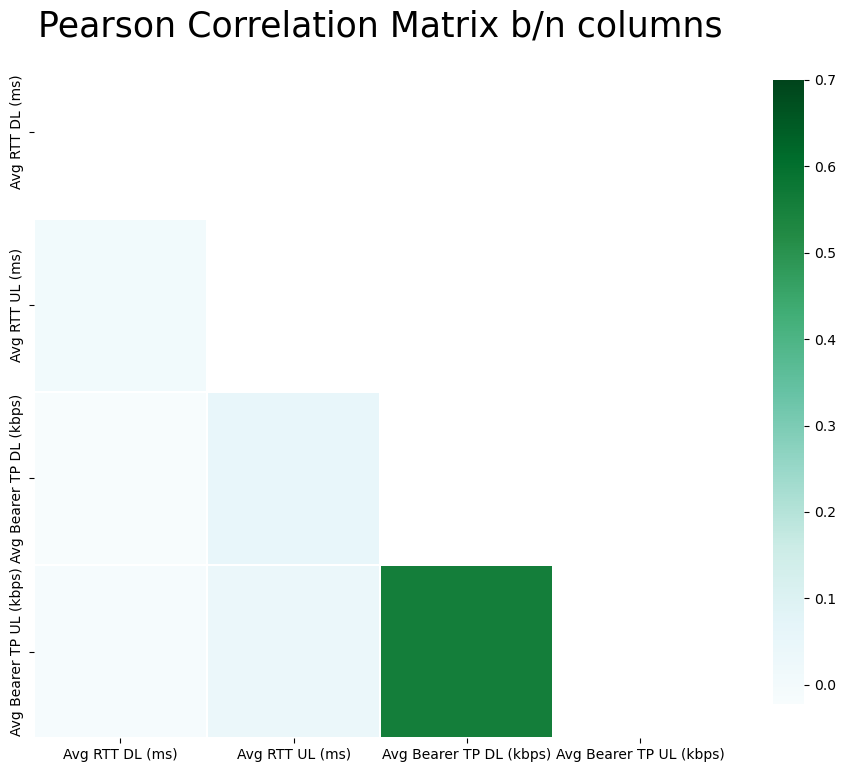

In [4]:
#cross correletion b/n numerical columns
mask = np.zeros_like(df_cleaned[col_types['numeric speed']].corr(), dtype=bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(12, 9))
plt.title('Pearson Correlation Matrix b/n columns',fontsize=25)

sns.heatmap(df_cleaned[col_types['numeric speed']].corr(),linewidths=0.25,vmax=0.7,square=True,cmap="BuGn", #"BuGn_r" to reverse
            linecolor='w',annot=True,annot_kws={"size":8},mask=mask,cbar_kws={"shrink": .9});

/home/abu-muhammed/anaconda3/envs/week1/lib/python3.11/site-packages/seaborn/matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


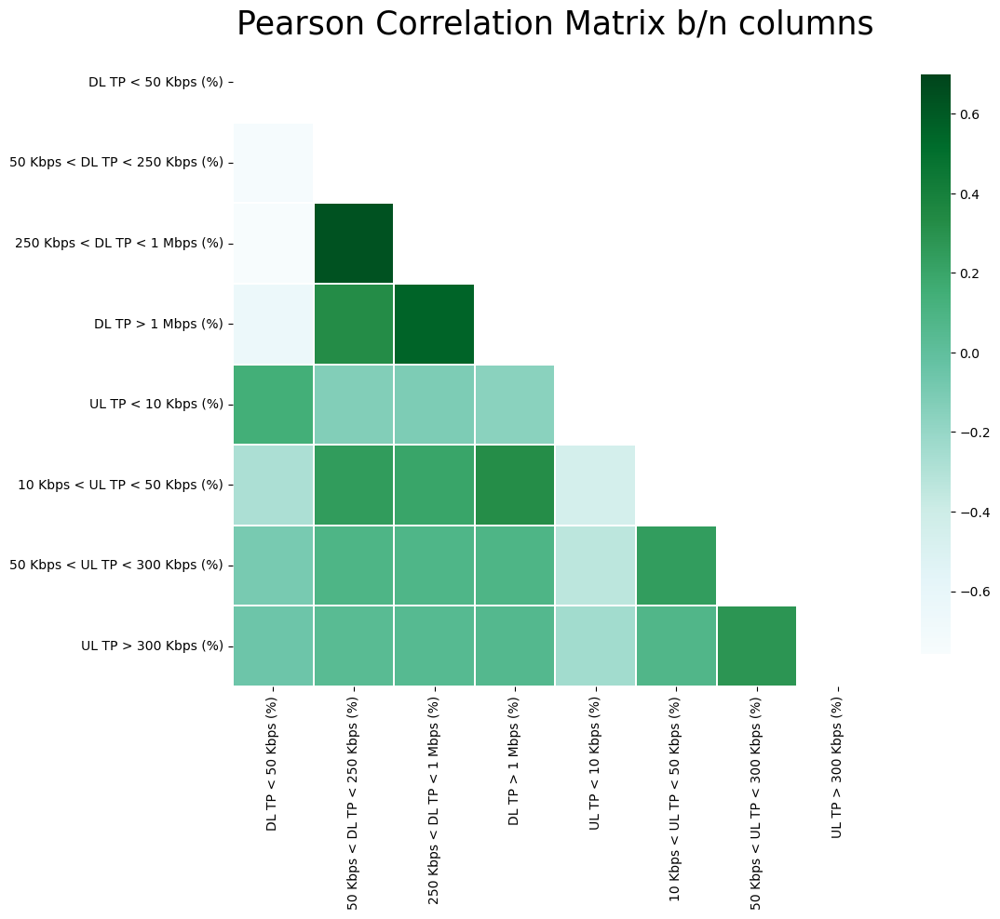

In [5]:
#cross correletion b/n numerical columns
mask = np.zeros_like(df_cleaned[col_types['numeric speed ratio']].corr(), dtype=bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(12, 9))
plt.title('Pearson Correlation Matrix b/n columns',fontsize=25)

sns.heatmap(df_cleaned[col_types['numeric speed ratio']].corr(),linewidths=0.25,vmax=0.7,square=True,cmap="BuGn", #"BuGn_r" to reverse
            linecolor='w',annot=True,annot_kws={"size":8},mask=mask,cbar_kws={"shrink": .9});

/home/abu-muhammed/anaconda3/envs/week1/lib/python3.11/site-packages/seaborn/matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


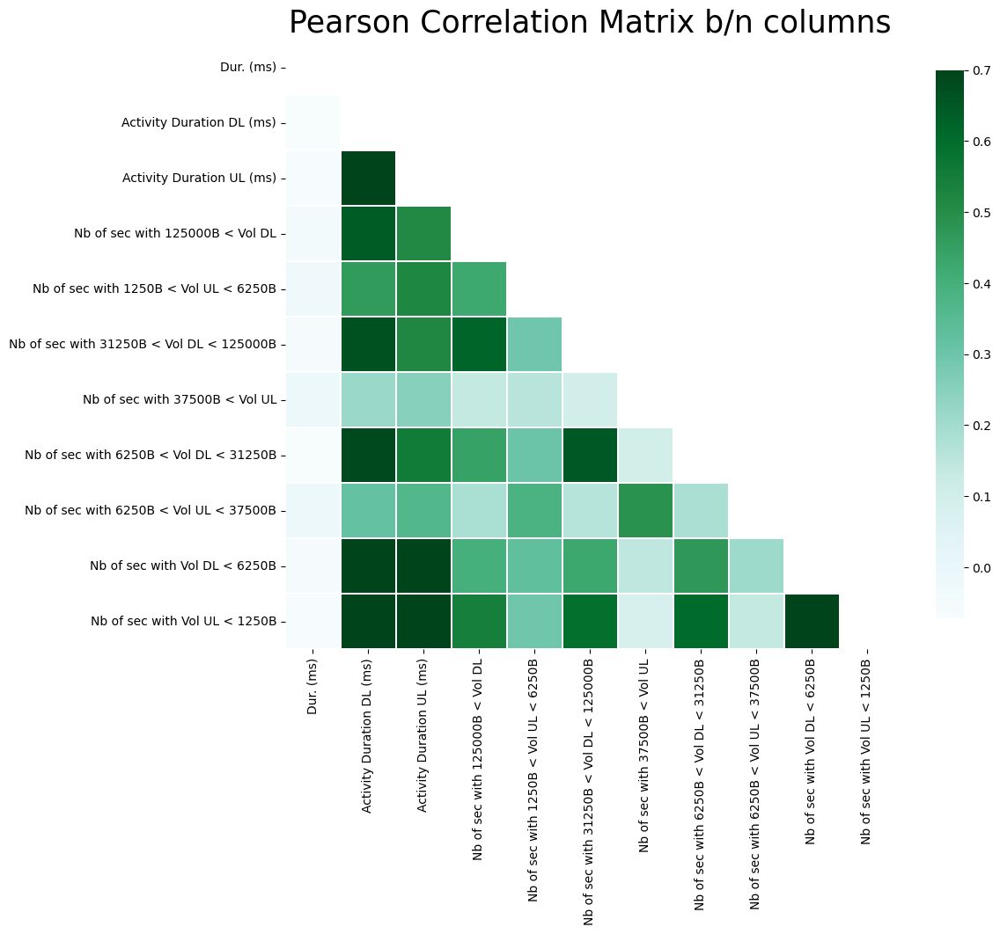

In [6]:
#cross correletion b/n numerical olumns
mask = np.zeros_like(df_cleaned[col_types['numeric time']].corr(), dtype=bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(12, 9))
plt.title('Pearson Correlation Matrix b/n columns',fontsize=25)

sns.heatmap(df_cleaned[col_types['numeric time']].corr(),linewidths=0.25,vmax=0.7,square=True,cmap="BuGn", #"BuGn_r" to reverse
            linecolor='w',annot=True,annot_kws={"size":8},mask=mask,cbar_kws={"shrink": .9});

## Overview Analysis
### Handset models analytics

In [ ]:
plot_count(df_cleaned, 'Handset Type', "Hnadset Types Count Plot")
plot_count(df_cleaned, 'Handset Manufacturer', "Handset Manufacturer Count Plot")

In [ ]:
#Top 25 categories only
plot_count(df_cleaned, 'Handset Type', "Hnadset Types Count Plot(Top 25)", 25)
plot_count(df_cleaned, 'Handset Manufacturer', "Handset Manufacturer Count Plot(Top 25)", 25)

In [8]:
#Top 10 handsets used by the customers
df_handsets = df_cleaned.groupby('Handset Type').size().reset_index(name='counts')
df_handsets.sort_values(by=['counts']).tail(10)

,Handset Type,counts
75,Apple iPhone X (A1901),3813
955,Samsung Galaxy S8 (Sm-G950F),4520
78,Apple iPhone Xr (A2105),4568
66,Apple iPhone 8 (A1905),4993
73,Apple iPhone Se (A1723),5187
59,Apple iPhone 7 (A1778),6326
49,Apple iPhone 6 (A1586),9023
53,Apple iPhone 6S (A1688),9419
1395,undefined,9559
316,Huawei B528S-23A,19752


In [9]:
#Top 3 handset manufacturers
df_manufacturers = df_cleaned.groupby('Handset Manufacturer').size().reset_index(name='counts')
df_manufacturers.sort_values(by=['counts']).tail(3)

,Handset Manufacturer,counts
52,Huawei,34423
103,Samsung,40839
5,Apple,59565


In [10]:
#Top 5 handsets per top 3 handset manufacturers(Apple, Samsung, & Huwawei)
#Top 5 Apple Handsets
df_using_Apple = df_cleaned.loc[df_cleaned['Handset Manufacturer'] == 'Apple']
df_Apple_Handsets = df_using_Apple.groupby('Handset Type').size().reset_index(name='counts')
top5_Apple = (df_Apple_Handsets.sort_values(by=['counts']).tail(5))['Handset Type'].to_list()
df_Apple_Handsets.sort_values(by=['counts']).tail(5)

,Handset Type,counts
48,Apple iPhone 8 (A1905),4993
55,Apple iPhone Se (A1723),5187
41,Apple iPhone 7 (A1778),6326
31,Apple iPhone 6 (A1586),9023
35,Apple iPhone 6S (A1688),9419


In [11]:
#Top 5 Samsung Handsets
df_using_Samsung = df_cleaned.loc[df_cleaned['Handset Manufacturer'] == 'Samsung']
df_Samsung_Handsets = df_using_Samsung.groupby('Handset Type').size().reset_index(name='counts')
top5_Samsung = (df_Samsung_Handsets.sort_values(by=['counts']).tail(5))['Handset Type'].to_list()
df_Samsung_Handsets.sort_values(by=['counts']).tail(5)

,Handset Type,counts
121,Samsung Galaxy S7 (Sm-G930X),3199
48,Samsung Galaxy J3 (Sm-J330),3484
56,Samsung Galaxy J5 (Sm-J530),3696
6,Samsung Galaxy A5 Sm-A520F,3724
123,Samsung Galaxy S8 (Sm-G950F),4520


In [12]:
#Top 5 Huawei Handsets
df_using_Huawei = df_cleaned.loc[df_cleaned['Handset Manufacturer'] == 'Huawei']
df_Huawei_Handsets = df_using_Huawei.groupby('Handset Type').size().reset_index(name='counts')
top5_Huawei = (df_Huawei_Handsets.sort_values(by=['counts']).tail(5))['Handset Type'].to_list()
df_Huawei_Handsets.sort_values(by=['counts']).tail(5)

,Handset Type,counts
154,Huawei Y6 2018,997
112,Huawei P20,1480
113,Huawei P20 Lite Huawei Nova 3E,2021
34,Huawei E5180,2079
13,Huawei B528S-23A,19752


In [ ]:
plot_count_multilevel(df_cleaned[['Handset Type', 'Handset Manufacturer']].loc[df_cleaned['Handset Type'].isin(top5_Apple+top5_Huawei+top5_Samsung)],'Handset Type','Handset Manufacturer',"Top 5 handsets from the top 3 manufactureres")

#### Per user agrigates

In [13]:
df_user_aggrigate = df_cleaned.groupby('MSISDN/Number').agg(
    Num_of_Sessions=('index', 'count'),Total_DL=('Total DL (Bytes)', np.sum),Total_UL=('Total UL (Bytes)', np.sum),Duration_ms=('Dur. (ms)', np.sum),
    Google_DL=('Google DL (Bytes)', np.sum),Google_UL=('Google UL (Bytes)', np.sum),Netflix_DL=('Netflix DL (Bytes)', np.sum),
    Netflix_UL=('Netflix UL (Bytes)', np.sum),Email_DL=('Email DL (Bytes)', np.sum),Email_UL=('Email UL (Bytes)', np.sum),
    YouTube_DL=('YouTube DL (Bytes)', np.sum),YouTube_UL=('YouTube UL (Bytes)', np.sum),Social_Media_DL=('Social Media DL (Bytes)', np.sum),
    Social_Media_UL=('Social Media UL (Bytes)', np.sum),Gaming_DL=('Gaming DL (Bytes)', np.sum),Gaming_UL=('Gaming UL (Bytes)', np.sum),
    Other_UL=('Other UL', np.sum),Other_DL=('Other DL', np.sum),
                                        )

/tmp/ipykernel_25324/4188230304.py:1: FutureWarning: The provided callable <function sum at 0x7fd244226480> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  df_user_aggrigate = df_cleaned.groupby('MSISDN/Number').agg(


In [14]:
df_user_aggrigate.sort_values(by=['Num_of_Sessions']).tail()

,Num_of_Sessions,Total_DL,Total_UL,Duration_ms,Google_DL,Google_UL,Netflix_DL,Netflix_UL,Email_DL,Email_UL,YouTube_DL,YouTube_UL,Social_Media_DL,Social_Media_UL,Gaming_DL,Gaming_UL,Other_UL,Other_DL
MSISDN/Number,,,,,,,,,,,,,,,,,,
3.365973e+10,16,6753.542387,595.341035,4.035428e+06,86.744832,24.373814,187.184530,193.826554,28.522155,5.809922,114.114901,131.924574,33.283657,0.488199,6303.692312,110.300771,128.617201,5896.139695
3.361489e+10,17,7778.876775,657.542230,9.966898e+06,89.589794,32.455520,171.266542,173.392353,32.050334,6.848739,190.566485,185.534263,26.464218,0.519562,7268.939401,121.495088,137.296706,7148.072759
3.362578e+10,17,7410.090773,695.779209,1.855375e+07,102.905978,32.809425,184.929121,155.514115,30.417835,8.333735,226.862939,205.112206,25.333520,0.544909,6839.641379,147.618950,145.845869,5914.356812
3.362632e+10,18,6963.268795,638.628694,8.791927e+06,110.727744,34.413716,190.238226,123.259069,31.857285,8.596417,156.449038,200.685826,40.763700,0.601713,6433.232802,135.267827,135.804124,7653.691131
0.000000e+00,1066,464366.571737,42271.902353,7.255100e+07,5729.620425,2136.835522,11719.685729,11410.323088,1815.841725,472.862606,11915.812989,11297.312150,1847.949086,34.429838,431771.243546,8328.501064,8630.854323,421455.655725


#### Univariate analysis of the user-aggrigated numerical values(data-volumes, ) 

In [ ]:
plot_hist(df_user_aggrigate, "Num_of_Sessions", "blue", "Number of Sessions distribution")
plot_hist(df_user_aggrigate, "Total_UL", "blue", "Total UL data volume(in MB) distribution")
plot_hist(df_user_aggrigate, "Total_DL", "blue", "Total DL data volume(in MB) distribution")
plot_hist(df_user_aggrigate, "Duration_ms", "red", "Google DL data volume(in MB) distribution")
plot_hist(df_user_aggrigate, "Google_DL", "green", "Google DL data volume(in MB) distribution")
plot_hist(df_user_aggrigate, "Google_UL", "green", "Google UL data volume(in MB) distribution")
plot_hist(df_user_aggrigate, "YouTube_DL", "green", "YouTube DL data volume(in MB) distribution")
plot_hist(df_user_aggrigate, "YouTube_UL", "green", "YouTube UL data volume(in MB) distribution")
plot_hist(df_user_aggrigate, "Email_DL", "green", "Email DL data volume(in MB) distribution")
plot_hist(df_user_aggrigate, "Email_UL", "green", "Email UL data volume(in MB) distribution")
plot_hist(df_user_aggrigate, "Social_Media_DL", "red", "Social Media DL data volume(in MB) distribution")
plot_hist(df_user_aggrigate, "Social_Media_UL", "red", "Social Media UL data volume(in MB) distribution")
plot_hist(df_user_aggrigate, "Netflix_DL", "red", "Netflix DL data volume(in MB) distribution")
plot_hist(df_user_aggrigate, "Netflix_UL", "red", "Netflix UL data volume(in MB) distribution")
plot_hist(df_user_aggrigate, "Gaming_DL", "black", "Gaming DL data volume(in MB) distribution")
plot_hist(df_user_aggrigate, "Gaming_UL", "black", "Gaming UL data volume(in MB) distribution")
plot_hist(df_user_aggrigate, "Other_DL", "black", "Other DL data volume(in MB) distribution")
plot_hist(df_user_aggrigate, "Other_UL", "black", "Other UL data volume(in MB) distribution")

In [ ]:
df_user_aggrigate.describe()

,Num_of_Sessions,Total_DL,Total_UL,Duration_ms,Google_DL,Google_UL,Netflix_DL,Netflix_UL,Email_DL,Email_UL,YouTube_DL,YouTube_UL,Social_Media_DL,Social_Media_UL,Gaming_DL,Gaming_UL,Other_UL,Other_DL
count,106857.000000,106857.000000,106857.000000,1.068570e+05,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000
mean,1.403755,608.638314,55.049606,1.468447e+05,7.698674,2.753143,15.565153,14.728320,2.398632,0.625684,15.574820,14.738569,2.403442,0.044082,565.001652,11.095883,11.064291,563.737683
std,3.355032,1486.276661,133.550162,2.894646e+05,18.435202,6.849457,37.682421,36.577206,5.835166,1.519781,38.254632,36.244366,5.925860,0.110279,1385.431340,26.772189,27.645796,1355.348002
min,1.000000,8.418161,2.734081,7.142000e+03,0.000197,0.000003,0.000040,0.000033,0.000093,0.000013,0.000051,0.000101,0.000011,0.000000,0.002399,0.000056,0.000149,0.003138
25%,1.000000,300.245464,34.709489,7.130900e+04,3.626733,1.278980,7.241805,6.872936,1.129672,0.292366,7.292911,6.911111,1.121439,0.020600,266.386806,5.193666,5.208228,263.957078
50%,1.000000,543.948418,44.626565,1.027410e+05,6.920617,2.473203,13.961825,13.235408,2.161300,0.560094,13.929048,13.225029,2.160092,0.039635,507.851553,9.962660,9.896198,505.399603
75%,2.000000,769.968143,62.688601,1.727990e+05,9.948030,3.570549,20.155662,19.081747,3.100063,0.813066,20.150294,19.052963,3.115934,0.057144,731.427216,14.382199,14.331369,729.910858
max,1066.000000,464366.571737,42271.902353,7.255100e+07,5729.620425,2136.835522,11719.685729,11410.323088,1815.841725,472.862606,11915.812989,11297.312150,1847.949086,34.429838,431771.243546,8328.501064,8630.854323,421455.655725


#### Outliers

In [ ]:
plot_box(df_user_aggrigate, "Num_of_Sessions", "Outliers in Number of Sessions")
plot_box(df_user_aggrigate, "Total_UL", "Outliers in Total UL")
plot_box(df_user_aggrigate, "Total_DL", "Outliers in Total DL")
plot_box(df_user_aggrigate, "Duration_ms", "Outliers in Session durations")
plot_box(df_user_aggrigate, "Google_DL", "Outliers in Google DL")
plot_box(df_user_aggrigate, "Google_UL", "Outliers in Google UL")
plot_box(df_user_aggrigate, "YouTube_DL", "Outliers in YouTube DL")
plot_box(df_user_aggrigate, "YouTube_UL", "Outliers in YouTube UL")
plot_box(df_user_aggrigate, "Email_DL", "Outliers in Email DL")
plot_box(df_user_aggrigate, "Email_UL", "Outliers in Email UL")
plot_box(df_user_aggrigate, "Social_Media_DL", "Outliers in Social Media DL")
plot_box(df_user_aggrigate, "Social_Media_UL", "Outliers in Social Media UL")
plot_box(df_user_aggrigate, "Netflix_DL", "Outliers in Netflix DL")
plot_box(df_user_aggrigate, "Netflix_UL", "Outliers in Netflix UL")
plot_box(df_user_aggrigate, "Gaming_DL", "Outliers in Gaming DL")
plot_box(df_user_aggrigate, "Gaming_UL", "Outliers in Gaming UL")
plot_box(df_user_aggrigate, "Other_DL", "Outliers in Other UL")
plot_box(df_user_aggrigate, "Other_UL", "Outliers in Other UL")

In [15]:
#fixing outliers in df_user_aggrigate
def fix_outliers(df, columns):
    for column in columns:
        df[column] = np.where(df[column] > df[column].quantile(0.95), df[column].median(),df[column])
    return df
df_user_aggrigate_outliers_fixed = fix_outliers(df_user_aggrigate, df_user_aggrigate.columns)

In [ ]:

plot_box(df_user_aggrigate_outliers_fixed, "Num_of_Sessions", "Outliers fixed in Number of Sessions")
plot_box(df_user_aggrigate_outliers_fixed, "Total_UL", "Outliers fixed in Total UL")
plot_box(df_user_aggrigate_outliers_fixed, "Total_DL", "Outliers fixed in Total DL")
plot_box(df_user_aggrigate_outliers_fixed, "Duration_ms", "Outliers fixed in Session durations")
plot_box(df_user_aggrigate_outliers_fixed, "Google_DL", "Outliers fixed in Google DL")
plot_box(df_user_aggrigate_outliers_fixed, "Google_UL", "Outliers fixed in Google UL")
plot_box(df_user_aggrigate_outliers_fixed, "YouTube_DL", "Outliers fixed in YouTube DL")
plot_box(df_user_aggrigate_outliers_fixed, "YouTube_UL", "Outliers fixed in YouTube UL")
plot_box(df_user_aggrigate_outliers_fixed, "Email_DL", "Outliers fixed in Email DL")
plot_box(df_user_aggrigate_outliers_fixed, "Email_UL", "Outliers fixed in Email UL")
plot_box(df_user_aggrigate_outliers_fixed, "Social_Media_DL", "Outliers fixed in Social Media DL")
plot_box(df_user_aggrigate_outliers_fixed, "Social_Media_UL", "Outliers fixed in Social Media UL")
plot_box(df_user_aggrigate_outliers_fixed, "Netflix_DL", "Outliers fixed in Netflix DL")
plot_box(df_user_aggrigate_outliers_fixed, "Netflix_UL", "Outliers fixed in Netflix UL")
plot_box(df_user_aggrigate_outliers_fixed, "Gaming_DL", "Outliers fixed in Gaming DL")
plot_box(df_user_aggrigate_outliers_fixed, "Gaming_UL", "Outliers fixed in Gaming UL")
plot_box(df_user_aggrigate_outliers_fixed, "Other_DL", "Outliers fixed in Other UL")
plot_box(df_user_aggrigate_outliers_fixed, "Other_UL", "Outliers fixed in Other UL")

In [ ]:
#histogram plots after fixing outliers
plot_hist(df_user_aggrigate_outliers_fixed, "Num_of_Sessions", "blue")
plot_hist(df_user_aggrigate_outliers_fixed, "Total_UL", "blue")
plot_hist(df_user_aggrigate_outliers_fixed, "Total_DL", "blue")
plot_hist(df_user_aggrigate_outliers_fixed, "Duration_ms", "red")
plot_hist(df_user_aggrigate_outliers_fixed, "Google_DL", "green")
plot_hist(df_user_aggrigate_outliers_fixed, "Google_UL", "green")
plot_hist(df_user_aggrigate_outliers_fixed, "YouTube_DL", "green")
plot_hist(df_user_aggrigate_outliers_fixed, "YouTube_UL", "green")
plot_hist(df_user_aggrigate_outliers_fixed, "Email_DL", "green")
plot_hist(df_user_aggrigate_outliers_fixed, "Email_UL", "green")
plot_hist(df_user_aggrigate_outliers_fixed, "Social_Media_DL", "green")
plot_hist(df_user_aggrigate_outliers_fixed, "Social_Media_UL", "green")
plot_hist(df_user_aggrigate_outliers_fixed, "Netflix_DL", "green")
plot_hist(df_user_aggrigate_outliers_fixed, "Netflix_UL", "green")
plot_hist(df_user_aggrigate_outliers_fixed, "Gaming_DL", "green")
plot_hist(df_user_aggrigate_outliers_fixed, "Gaming_UL", "green")
plot_hist(df_user_aggrigate_outliers_fixed, "Other_DL", "green")
plot_hist(df_user_aggrigate_outliers_fixed, "Other_UL", "green")

In [84]:
df_user_aggrigate_outliers_fixed.describe()

,Num_of_Sessions,Total_DL,Total_UL,Duration_ms,Google_DL,Google_UL,Netflix_DL,Netflix_UL,Email_DL,Email_UL,YouTube_DL,YouTube_UL,Social_Media_DL,Social_Media_UL,Gaming_DL,Gaming_UL,Other_UL,Other_DL
count,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000,106857.000000
mean,1.283519,536.121503,48.765363,119661.057965,6.764990,2.418095,13.664276,12.943863,2.106201,0.549336,13.672971,12.950180,2.113821,0.038750,496.677688,9.756024,9.716891,495.360311
std,0.534699,303.825579,21.009003,76947.785003,4.004745,1.437684,8.142217,7.706497,1.248144,0.326939,8.135411,7.670387,1.255214,0.023083,294.254911,5.801209,5.761624,294.743752
min,1.000000,8.418161,2.734081,7142.000000,0.000197,0.000003,0.000040,0.000033,0.000093,0.000013,0.000051,0.000101,0.000011,0.000000,0.002399,0.000056,0.000149,0.003138
25%,1.000000,300.245464,34.709489,71309.000000,3.626733,1.278980,7.241805,6.872936,1.129672,0.292366,7.292911,6.911111,1.121439,0.020600,266.386806,5.193666,5.208228,263.957078
50%,1.000000,543.948418,44.626565,102741.000000,6.920617,2.473203,13.961825,13.235408,2.161300,0.560094,13.929048,13.225029,2.160092,0.039635,507.851553,9.962660,9.896198,505.399603
75%,1.000000,725.699608,56.243198,163649.000000,9.363666,3.356939,18.965327,17.926829,2.913075,0.763352,18.974983,17.933384,2.931779,0.053731,687.455018,13.541122,13.466735,685.613018
max,3.000000,1426.349929,118.692809,369762.000000,18.385673,6.566751,37.130247,35.128288,5.724936,1.494494,37.176012,35.116093,5.722544,0.105532,1345.607018,26.489233,26.353522,1347.633454


#### Bivariate analysis of Application level and total data UL/DL volumes

/home/abu-muhammed/anaconda3/envs/week1/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/abu-muhammed/anaconda3/envs/week1/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/abu-muhammed/anaconda3/envs/week1/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/abu-muhammed/anaconda3/envs/week1/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

<Figure size 2400x1400 with 0 Axes>

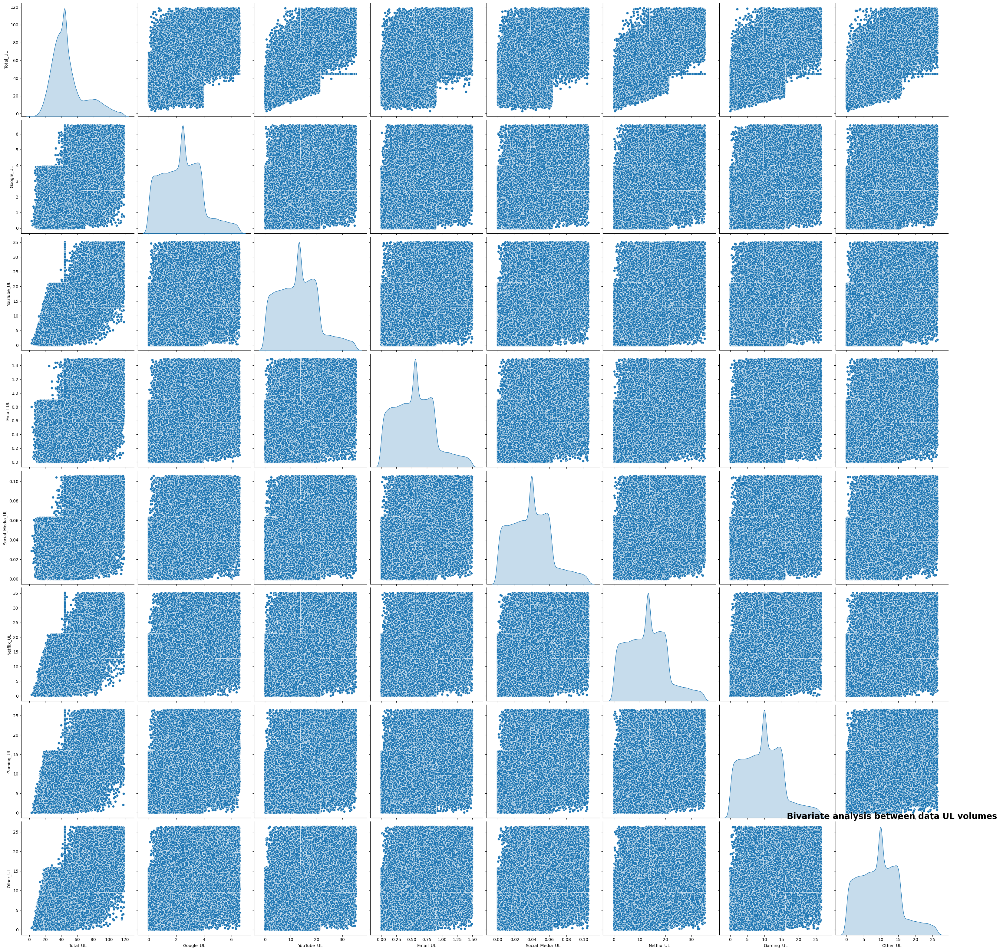

In [17]:
ul_colmns = ['Total_UL', 'Google_UL', 'YouTube_UL', 'Email_UL', 'Social_Media_UL', 'Netflix_UL', 'Gaming_UL', 'Other_UL']
dl_colmns = ['Total_DL', 'Google_DL', 'YouTube_DL', 'Email_DL', 'Social_Media_DL', 'Netflix_DL', 'Gaming_DL', 'Other_DL']
plot_bivariate_pair(df_user_aggrigate_outliers_fixed[ul_colmns],"Bivariate analysis between data UL volumes")

#### Top 5 decile user classes based on duration

/tmp/ipykernel_25324/2910874740.py:2: FutureWarning: The provided callable <function sum at 0x7fd244226480> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  df_decile_Total_UL_DL = (df_user_aggrigate_outliers_fixed.groupby('Decile_rank').agg(Total_Decile_UL=('Total_UL',  np.sum),Total_Decile_DL=('Total_DL', np.sum))).sort_values(by=['Decile_rank'])


<Axes: xlabel='Decile_rank'>

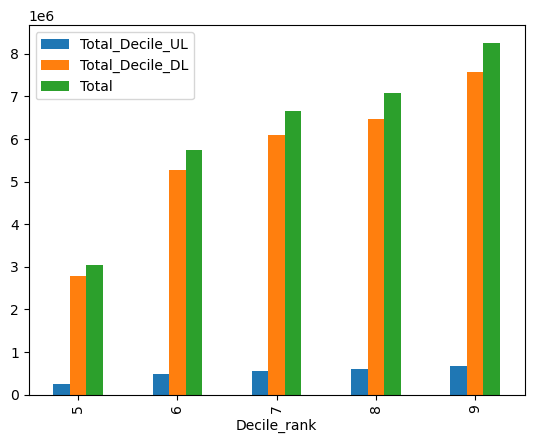

In [18]:
df_user_aggrigate_outliers_fixed['Decile_rank'] = pd.qcut(df_user_aggrigate_outliers_fixed['Duration_ms'], 10, labels = False) 
df_decile_Total_UL_DL = (df_user_aggrigate_outliers_fixed.groupby('Decile_rank').agg(Total_Decile_UL=('Total_UL',  np.sum),Total_Decile_DL=('Total_DL', np.sum))).sort_values(by=['Decile_rank'])
df_decile_Total_UL_DL['Total'] = df_decile_Total_UL_DL['Total_Decile_UL'] + df_decile_Total_UL_DL['Total_Decile_DL']
df_decile_Total_UL_DL[5:].plot.bar()

In [98]:
df_decile_Total_UL_DL[5:]

,Total_Decile_UL,Total_Decile_DL,Total
Decile_rank,,,
5,255986.618943,2.782105e+06,3.038092e+06
6,481802.274088,5.266267e+06,5.748070e+06
7,563693.843115,6.092731e+06,6.656425e+06
8,597218.366308,6.478984e+06,7.076202e+06
9,681327.069248,7.576363e+06,8.257690e+06


#### cross correlation b/n application data volumes

/home/abu-muhammed/anaconda3/envs/week1/lib/python3.11/site-packages/seaborn/matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


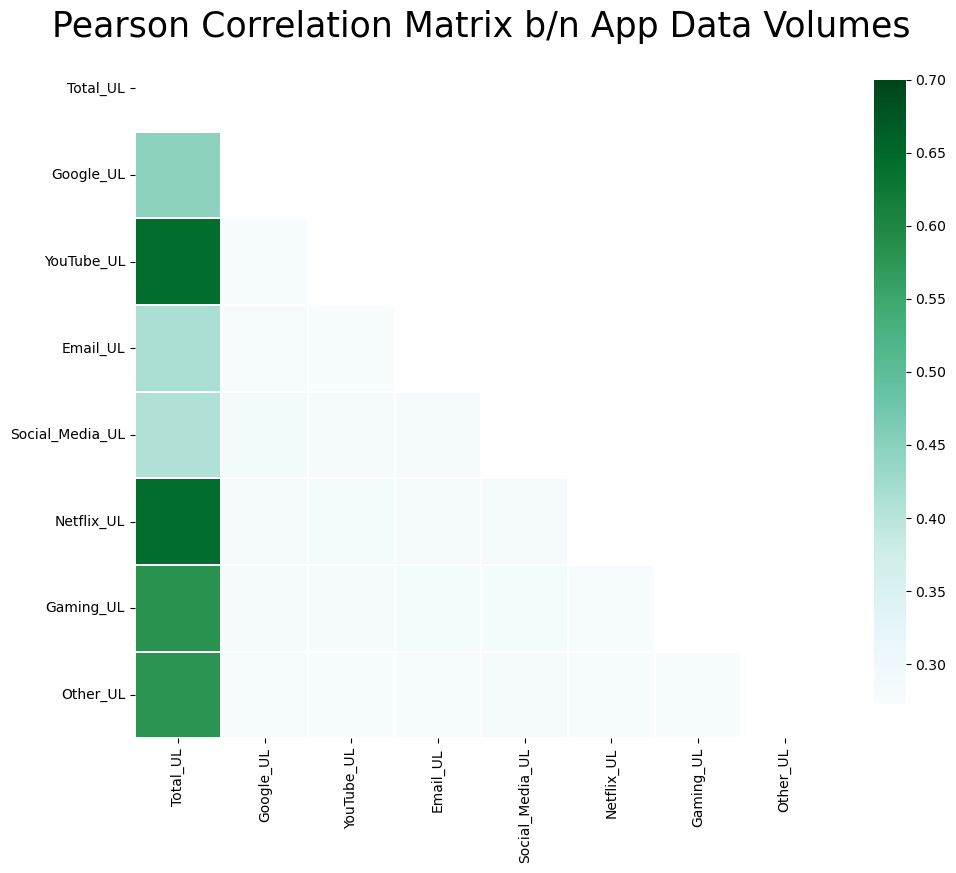

In [105]:
# for uplink
mask = np.zeros_like(df_user_aggrigate_outliers_fixed[ul_colmns].corr(), dtype=bool)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(12, 9))
plt.title('Pearson Correlation Matrix b/n App Data Volumes',fontsize=25)

sns.heatmap(df_user_aggrigate_outliers_fixed[ul_colmns].corr(),linewidths=0.25,vmax=0.7,square=True,cmap="BuGn",
            linecolor='w',annot=True,annot_kws={"size":8},mask=mask,cbar_kws={"shrink": .9});

/home/abu-muhammed/anaconda3/envs/week1/lib/python3.11/site-packages/seaborn/matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


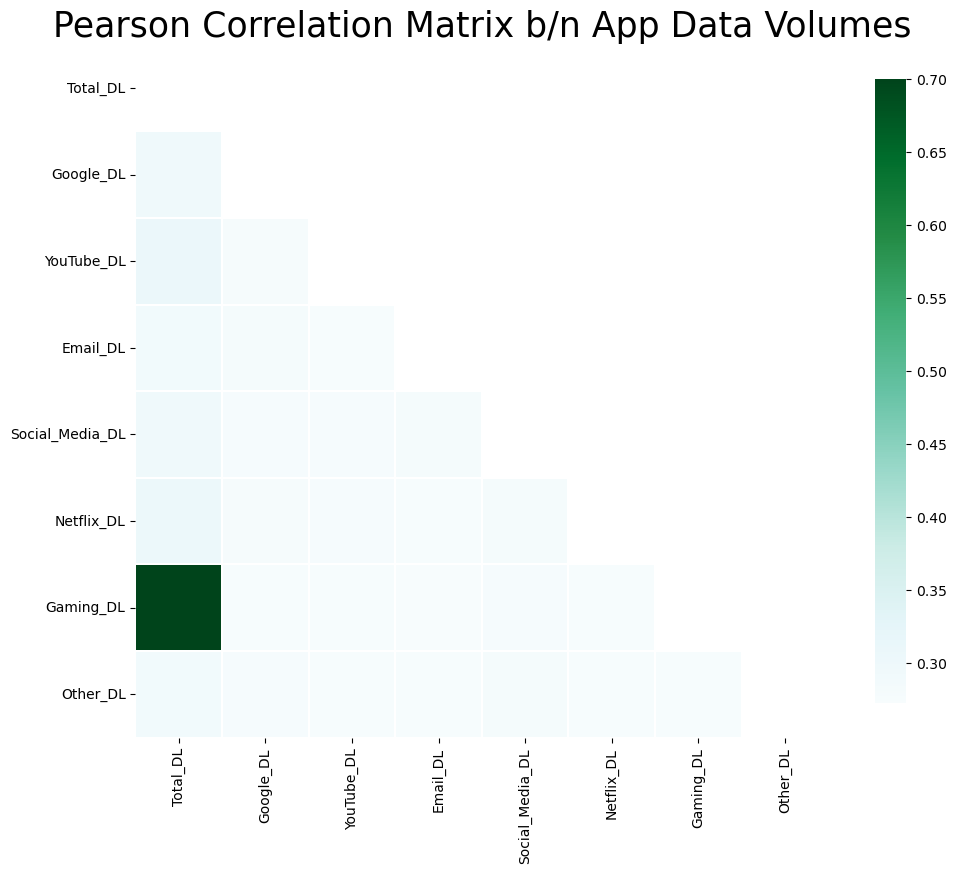

In [106]:
# for downlink
mask = np.zeros_like(df_user_aggrigate_outliers_fixed[dl_colmns].corr(), dtype=bool)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(12, 9))
plt.title('Pearson Correlation Matrix b/n App Data Volumes',fontsize=25)

sns.heatmap(df_user_aggrigate_outliers_fixed[dl_colmns].corr(),linewidths=0.25,vmax=0.7,square=True,cmap="BuGn",
            linecolor='w',annot=True,annot_kws={"size":8},mask=mask,cbar_kws={"shrink": .9});

In [19]:
#save the final df as pkl dump
df_user_aggrigate_outliers_fixed.to_pickle("../data/df_user_aggrigate_outliers_fixed.pkl")
df_decile_Total_UL_DL.to_pickle("../data/df_decile_Total_UL_DL.pkl")
with open('../data/aggrig_col_types.pickle', 'wb') as handle:
    pickle.dump({'ul':ul_colmns, 'dl':dl_colmns}, handle, protocol=pickle.HIGHEST_PROTOCOL)
del df_user_aggrigate_outliers_fixed, df_decile_Total_UL_DL, df_cleaned, df_user_aggrigate, df_using_Huawei, df_using_Samsung, 
df_using_Apple, df_Apple_Handsets, df_Samsung_Handsets, df_Huawei_Handsets
gc.collect()

604